In [1]:
using LightGraphs, Plots, GraphPlot, Compose, Random, StatsBase

In [2]:
include("ContactModels.jl")

buildstate (generic function with 3 methods)

In [3]:
include("EpiSim.jl")

Main.EpiSim

## Load the data


In [4]:
using CSV

In [5]:
wapop=CSV.read("all-wa.csv")

,City / Town,Column2,Region,Remoteness Areas
,String⍰,String⍰,String,String
1,Perth,"1,874,578",Perth,Major Cities of Australia
2,missing,missing,Perth,Remote
3,Bunbury,"71,090",South West,Inner Regional Australia
4,missing,missing,South West,Outer Regional Australia
5,Geraldton,"31,982",Mid West,Inner Regional Australia
6,missing,missing,Mid West,Outer Regional Australia
7,Kalgoorlie-Boulder,"29,875",Goldfields-Esperance,Inner Regional Australia
8,missing,missing,Goldfields-Esperance,Outer Regional Australia
9,Albany,"29,373",Great Southern,Inner Regional Australia


## remove the empty towns

wapop2 is wapop with allt he empty towns deleted.  Both data frames come `all-wa.csv` which is a mash up of the two files that orlando provided.

In [6]:
(nr,nc)=size(wapop)
    townpop1=wapopint=parse.(Int, replace.(wapop[1:2:116,2], r","=> ""))
    townpop2=wapopint=parse.(Int, replace.(wapop[116+1:end,2], r","=> ""))
    popl=[townpop1; townpop2]
nr=nr-58
rowidx=[]
for i in 59:nr
    if popl[i]!=0
        rowidx=[rowidx; i]
    end
end
rowidx=[1:116; rowidx.+58]
wapop2=wapop[rowidx,:] #remove all empty settlements.

,City / Town,Column2,Region,Remoteness Areas
,String⍰,String⍰,String,String
1,Perth,"1,874,578",Perth,Major Cities of Australia
2,missing,missing,Perth,Remote
3,Bunbury,"71,090",South West,Inner Regional Australia
4,missing,missing,South West,Outer Regional Australia
5,Geraldton,"31,982",Mid West,Inner Regional Australia
6,missing,missing,Mid West,Outer Regional Australia
7,Kalgoorlie-Boulder,"29,875",Goldfields-Esperance,Inner Regional Australia
8,missing,missing,Goldfields-Esperance,Outer Regional Australia
9,Albany,"29,373",Great Southern,Inner Regional Australia


In [7]:
wapop=wapop2

,City / Town,Column2,Region,Remoteness Areas
,String⍰,String⍰,String,String
1,Perth,"1,874,578",Perth,Major Cities of Australia
2,missing,missing,Perth,Remote
3,Bunbury,"71,090",South West,Inner Regional Australia
4,missing,missing,South West,Outer Regional Australia
5,Geraldton,"31,982",Mid West,Inner Regional Australia
6,missing,missing,Mid West,Outer Regional Australia
7,Kalgoorlie-Boulder,"29,875",Goldfields-Esperance,Inner Regional Australia
8,missing,missing,Goldfields-Esperance,Outer Regional Australia
9,Albany,"29,373",Great Southern,Inner Regional Australia


## Metric for similarity

`simiaritytown` computes a measure for the similarity between two locales - based on laguages spoken and whether they are within the same districts. Note that `majorlocalities` is hardcoded - I'm lazy.

In [8]:
    majorlocalities=58    #global scope intended.

58

In [9]:
function similaritytown(df,i,j)
    # similaritytown(df,i,j)
    # Define a "similarity" between two locations. This code is an ad-hoc rule that is an 
    # attempt to model the amount of movement between discrete regions. Dataframe df is 
    # assumed to be in the "Orlando format" as illustrated above.
    bonus1=100  #effectively, the larger the bonus, the more we include non-indigeneos travel.
    bonus2=10   #bonus1 is for towns in the same region, bonus2 for the same LGA
    if i<j
        score=similaritytown(df,j,i)
        return score
    elseif i<=majorlocalities && j<=majorlocalities
        x1= convert(Matrix{Int}, df[2*i-1:2*i,6:end])
        x2= convert(Matrix{Int}, df[2*j-1:2*j,6:end])
        languagesimilarity=x1[:]'*x2[:]        #or not
        regionbonus= (df[2*i,3]==df[2*j,3])*bonus1
    elseif i>majorlocalities && j>majorlocalities
        x1= convert(Vector{Int}, df[majorlocalities+i,6:end])
        x2= convert(Vector{Int}, df[majorlocalities+j,6:end])
        languagesimilarity=x1[:]'*x2[:]        #or not
        regionbonus= (df[i+majorlocalities,3]==df[j+majorlocalities,3])*bonus1 #same region
        regionbonus= regionbonus + (df[i+majorlocalities,5]==df[j+majorlocalities,5])*bonus2 #and same locality
    else
        x1= convert(Vector{Int}, df[majorlocalities+i,6:end])
        x1= reshape(x1,1,length(x1))
        x2= convert(Matrix{Int}, df[2*j-1:2*j,6:end])
        languagesimilarity= (sum(x2,dims=1) * x1[:])[1]      #or not
        regionbonus= (df[i+majorlocalities,3]==df[2*j,3])*bonus1 #same region
    end
    score=Int(floor(sqrt(languagesimilarity+regionbonus))) # sqrt? why not?
    return score
end

similaritytown (generic function with 1 method)

In [10]:
(nr,nc)=size(wapop)
nr=nr-majorlocalities
######################################
dist=Array{Int,2}(undef,nr,nr)
for i in 1:nr
    for j in 1:nr
        dist[i,j]=similaritytown(wapop,i,j)
    end
end

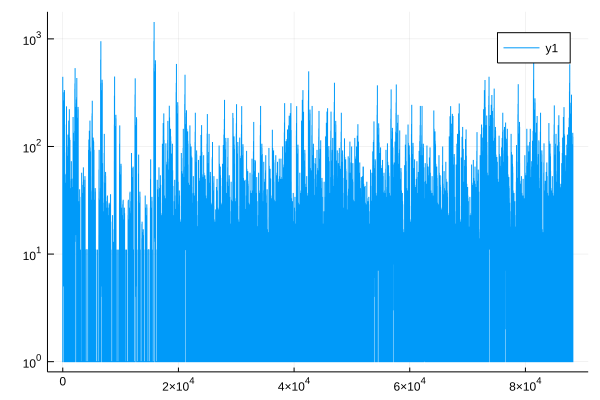

In [11]:
plot(dist[:].+1,yaxis=:log)

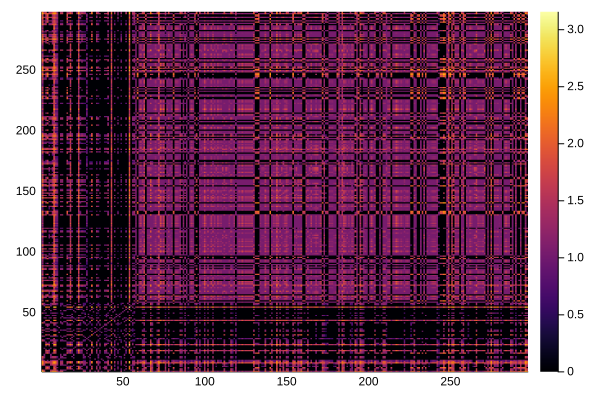

In [12]:
heatmap(log10.(dist.+1))

# Compute and view the inferred connectivity structure

The following section is just to test the network structure of connectivity between communities. Note, of course, that community level connection as encoded in `dist` is not the same thing as the individual level connectivity. `dist(i,j)` is intended to be a population-independent measure of the likelihood of travel between two locations.

In [13]:
# extract information from dataframe
#
#population
brk=majorlocalities*2
townpop1=wapopint=parse.(Int, replace.(wapop[1:2:brk,2], r","=> ""))
townpop2=wapopint=parse.(Int, replace.(wapop[brk+1:end,2], r","=> ""))
townpop=[townpop1; townpop2]
#townpop=townpop[1:end-1]
#region and assign colouring
nodecolor = [colorant"lightseagreen", colorant"orange", colorant"red", colorant"green", colorant"yellow", colorant"brown", colorant"pink", colorant"purple", colorant"blue", colorant"violet", colorant"black"]
townlabel=[wapop[1:2:brk,3]; wapop[brk+1:end,3]]
#townlabel=townlabel[1:end-1]
regions=unique(townlabel)
regioni=Array{Int,1}(undef,nr)
for i in 1:nr
    regioni[i]=findall(x->x==1,townlabel[i].==regions)[1]
end
nodefillc = nodecolor[regioni]
#town names
townlabel=[wapop[1:2:brk,1]; wapop[brk+1:end,1]]
#townlabel=townlabel[1:end-1]

297-element Array{Union{Missing, String},1}:
 "Perth"
 "Bunbury"
 "Geraldton"
 "Kalgoorlie-Boulder"
 "Albany"
 "Busselton"
 "Karratha"
 "Broome"
 "Port Hedland"
 "Esperance"
 "Yanchep"
 "Collie"
 "Northam"
 ⋮
 "Rollah"
 "Woodgamia"
 "Bidan"
 "Wanarn"
 "Pandanus Park"
 "Kanpa"
 "Punmu"
 "Kundat Djaru"
 "Wandanooka"
 "Kunawarritji"
 "Looma"
 "Cheeditha"

In [14]:
gplot(Graph(dist.>9),nodefillc=nodefillc)

In [15]:
bigtownlabel=deepcopy(townlabel)
bigtownlabel[majorlocalities+1:end].="";

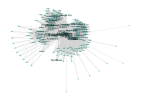

In [16]:
#just have alook at the Kimberley
ind=findall( x->(x == 7), regioni)
gplot(Graph(dist[ind,ind].>19),nodelabel=townlabel[ind],nodelabelsize=log.(townpop[ind]),nodesize=10 .+ log.(townpop[ind]))


In [17]:
gplot(Graph(dist.>9),nodelabel=bigtownlabel,nodelabelsize=log.(townpop),nodesize=10 .+ log.(townpop),nodefillc=nodefillc)



In [18]:
gr()

Plots.GRBackend()

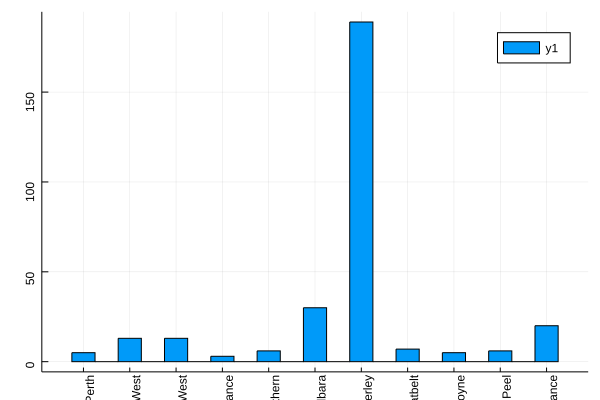

In [19]:
histogram(regioni,rotation=90,xticks=(1.25:(length(regions)+0.25),regions))

## Construct the full individual-level connectivity structure for WA

Each node is a person. Connectivity between people (Across regions) is determined by the `similaritytown()` score. Now (23/6) modified to better control overall quantity of travel - subject to total population in towns and settlements. 

In [20]:
using StatsBase

In [21]:
function buildstate(statedata,netbuilder, p, smalltown::Bool=true, richclub::Bool=false)
    # buildstate(statedata, netbuilder, p)
    ##############################################################################
    #statedata is a csv table loaded from the structure /format above (AKA the Orlando Format)
    #netbuilder is the intra-locale network construction rule (a function)
    #smalltown==true will bias toward travel to/from remote communities, otherwise travel will be predominantly to the largest places
    #richclub==true preferences "popular" (hihgly connected) nodes as travellers
    ##############################################################################
    # 
    #extract the data from CSV table
    #majorlocalities=58
    brk=majorlocalities*2
    locale=[statedata[1:2:brk,1]; statedata[brk+1:end,1]]
    townpop1=wapopint=parse.(Int, replace.(statedata[1:2:brk,2], r","=> ""))
    townpop2=wapopint=parse.(Int, replace.(statedata[brk+1:end,2], r","=> ""))
    popl=[townpop1; townpop2]
    npl=length(popl)
    net=SimpleGraph() #empty graph
    transit=Array{Int64,2}(undef,npl,npl) #number of transits beween locale[i] and locale[j]
    #################################
    # Population connectivity within regions
    #
    for (i,town) in enumerate(locale)
        println("Adding ",town," (population: ",popl[i],")")
        #add the intralocale links
        if popl[i]>0
            netadd=netbuilder(popl[i]) #use the preassigned method to add the new component
            net=blockdiag(net,netadd)
        end
        #compute the amount of transit
        for j in 1:(i-1) #number of transit between here and every other previous part
        transit[i,j] = Int(floor(similaritytown(statedata,i,j)))
            transit[j,i]=transit[i,j]
        end
        transit[i,i]=0
    end
    #################################
    # Population connectivity between regions
    #    
    rr=[0; cumsum(popl)]
	tpopl=sum(popl)/sum(sqrt.(popl))
    nedges_add = 0
    for i in 1:npl
        #do one of the following two lines
        if smalltown
            addlink=Int(floor(minimum([popl[i],tpopl*p*sqrt(popl[i])]))) #biased to small communities -  testing the effect of the hypothesis of more movement in these communities
        else
            addlink=Int(floor(p*popl[i])) #unbiased
        end
        edg1=rand(collect(rr[i]+1:rr[i+1]),addlink)
        destpdf=transit[i,:] .* maximum([popl[i]./popl[:];1])
        destpdf[i]=0
        edg2 = sample(1:npl, Weights(destpdf) , addlink)
        for k in 1:addlink
            rrs=rr[edg2[k]]+1:rr[edg2[k]+1]
            #do one of the following two lines
            if richclub
                edg2k = sample(rrs, Weights(degree(net[rrs]))) #biased by target degree
            else
                edg2k = rand(collect(rrs))   #random sample of the relevant community
            end
            edg2[k] = edg2k
        end
        #need to do it twice, so that the node degrees don't grow   
        for k in 1:addlink
                    add_edge!(net,edg1[k],edg2[k]) #this is grossly inefficient
                    nedges_add += 1
        end
    end
    #all done
    println(" $nedges_add edges added")
    return net, transit, locale, popl, nedges_add
end

buildstate (generic function with 3 methods)

## Run the simulations

Some examples are given. Note that `ContactModels.jl` has been modified and may need to be modified further. Still to do - more than five person households.

In [22]:
net, transit, locale, popl, nedges_added = buildstate(wapop[1:end-1,:], x -> covidsafe(nomassmix(x),0.5), 0.01, true, false)
#net, transit, locale, popl, nedges_added = buildstate(wapop[1:end-1,:], x -> nomassmix(x))
#net, transit, locale, popl, nedges_added = buildstate(wapop, x -> fullmixing(x))

Adding Perth (population: 1874578)
Adding Bunbury (population: 71090)
Adding Geraldton (population: 31982)
Adding Kalgoorlie-Boulder (population: 29875)
Adding Albany (population: 29373)
Adding Busselton (population: 25329)
Adding Karratha (population: 15828)
Adding Broome (population: 13984)
Adding Port Hedland (population: 13828)
Adding Esperance (population: 10421)
Adding Yanchep (population: 8859)
Adding Collie (population: 7192)
Adding Northam (population: 6548)
Adding Margaret River (population: 6392)
Adding Dunsborough (population: 6039)
Adding Newman (population: 4567)
Adding Carnarvon (population: 4426)
Adding Kununurra (population: 4341)
Adding Narrogin (population: 4274)
Adding Manjimup (population: 4213)
Adding Pinjarra (population: 3896)
Adding Katanning (population: 3702)
Adding Derby (population: 3325)
Adding Tom Price (population: 2956)
Adding Port Denison-Dongara (population: 2782)
Adding Harvey (population: 2750)
Adding Merredin (population: 2636)
Adding Denmark (popu

Adding Parnpajinya (population: 60)
Adding Rarrdjali (population: 12)
Adding Robe River Junction (population: 4)
Adding Red Shells (population: 3)
Adding Mud Springs (population: 13)
Adding Crocodile Hole (population: 16)
Adding Tappers Inlet (population: 12)
Adding Tirralintji (population: 13)
Adding Tkalka Boorda (population: 1)
Adding Tjirrkarli (population: 62)
Adding Tjukurla (population: 54)
Adding Warburton (population: 576)
Adding Wakathuni (population: 91)
Adding Wanamulnyundong (population: 20)
Adding Wangkatjungka (population: 254)
Adding Warakurna (population: 268)
Adding Warmun (population: 366)
Adding Warralong (population: 113)
Adding Warrayu (population: 45)
Adding Gullaweed (population: 15)
Adding Wijilawarrim (population: 46)
Adding Windidda (population: 35)
Adding Windjingayr (population: 30)
Adding Balgo (population: 359)
Adding Wongatha Wonganarra (population: 51)
Adding Woolergerberleng (population: 19)
Adding Woolah (population: 64)
Adding Wuggubun (population: 5

({2340564, 3693369} undirected simple Int64 graph, [0 77 … 72 323; 77 0 … 0 56; … ; 72 0 … 0 0; 323 56 … 0 0], Union{Missing, String}["Perth", "Bunbury", "Geraldton", "Kalgoorlie-Boulder", "Albany", "Busselton", "Karratha", "Broome", "Port Hedland", "Esperance"  …  "Woodgamia", "Bidan", "Wanarn", "Pandanus Park", "Kanpa", "Punmu", "Kundat Djaru", "Wandanooka", "Kunawarritji", "Looma"], [1874578, 71090, 31982, 29875, 29373, 25329, 15828, 13984, 13828, 10421  …  41, 12, 142, 135, 18, 145, 179, 40, 83, 531], 23149)

In [23]:
#'reasonable' parameters ################################
epiparam=Dict()
epiparam["p0"]=0.2 #a guess - tuned to match observed data 
epiparam["p2"]=1/12 #revised infection rate with distancing measure
epiparam["q"]=1/7 #"up to" two weeks
epiparam["r0"]=1/14 #about two weeks for mild, 3-6 for severe
epiparam["r2"]=1/4 #revised removal rate (now due to testing and isolation)
#########################################################
epiparam["nseeds"]=5 #probably too many, consider dropping. 
epiparam["pop"]=size(net)[1]

2340564

In [24]:
ndays=90
nsims=200
St,Et,It,Rt = EpiSim.episim(net, epiparam, ndays, nsims)  #no change-point nsims simulations for ndays days
#this run is really just a sanity check

100.0%┣████████████████████████████████████████┫ 200/200 [31:54<00:00, 0.1 it/s]


(UInt64[0x000000000023b6cf 0x000000000023b6cf … 0x000000000023b6cf 0x000000000023b6cf; 0x000000000023b6cf 0x000000000023b6cf … 0x000000000023b6ce 0x000000000023b6cf; … ; 0x0000000000237093 0x00000000002334ea … 0x00000000002330fb 0x000000000022d455; 0x000000000023692a 0x0000000000232700 … 0x0000000000232316 0x000000000022c15a], UInt64[0x0000000000000004 0x0000000000000005 … 0x0000000000000004 0x0000000000000005; 0x0000000000000004 0x0000000000000004 … 0x0000000000000005 0x0000000000000005; … ; 0x0000000000001d6d 0x0000000000003630 … 0x0000000000003861 0x000000000000565c; 0x0000000000002094 0x0000000000003c61 … 0x0000000000003df5 0x0000000000005d1b], UInt64[0x0000000000000001 0x0000000000000000 … 0x0000000000000001 0x0000000000000000; 0x0000000000000001 0x0000000000000001 … 0x0000000000000001 0x0000000000000000; … ; 0x0000000000001868 0x0000000000002d08 … 0x0000000000002dd0 0x0000000000004f42; 0x0000000000001aba 0x0000000000003176 … 0x00000000000032f5 0x00000000000055c4], UInt64[0x000000

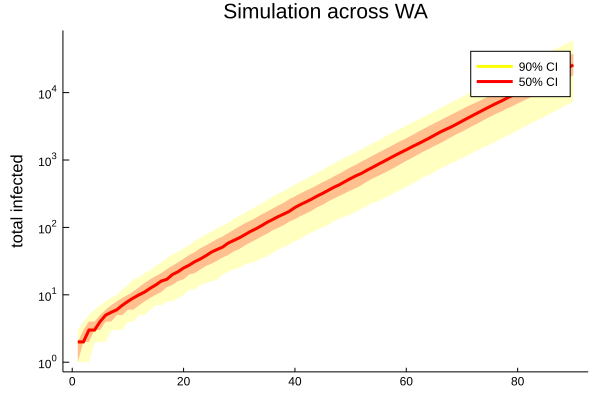

In [25]:
#log scale plot of model growth in infection 
plot(title="Simulation across WA", ylabel="total infected",yaxis=:log)
EpiSim.plotquantiles(It+Rt.+1,:yellow,"90% CI",0.45) #need to add one, otherwise log gets upset
EpiSim.plotquantiles(It+Rt.+1,:red,"50% CI",0.25)

In [26]:
    townpop1=parse.(Int, replace.(wapop[1:2:116,2], r","=> ""))
    townpop2=parse.(Int, replace.(wapop[116+1:(end-1),2], r","=> ""))
    popl=[townpop1; townpop2]

296-element Array{Int64,1}:
 1874578
   71090
   31982
   29875
   29373
   25329
   15828
   13984
   13828
   10421
    8859
    7192
    6548
       ⋮
      10
       8
      41
      12
     142
     135
      18
     145
     179
      40
      83
     531

In [27]:
#now, do the same things, but keep track of the count in each town
ndays=210
nsims=500
locpop=cumsum([1; popl],dims=1)
St,Et,It,Rt = EpiSim.episimcom(net, locpop, epiparam, ndays, nsims)  #no change-point nsims simulations for ndays days
#St[i,j,k] is the number of susceptibles in locale k on day i of simulation j
;


100.0%┣█████████████████████████████████████┫ 500/500 [02:43:56<00:00, 0.1 it/s]


In [28]:
using JLD2, FileIO
filename="remote_p01_TF_covidsafe_nomass.jld"
@save "remote_p01_TF_covidsafe_nomass.jld" St Et It Rt

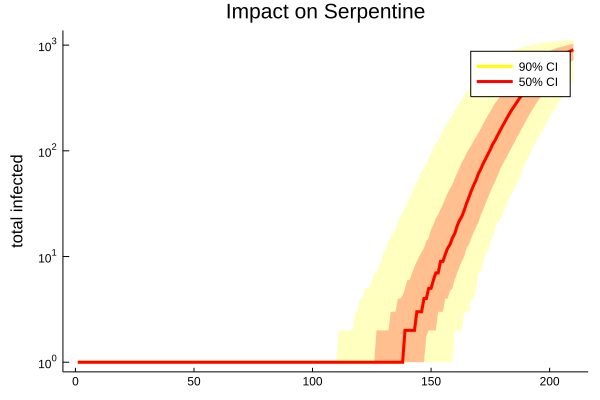

In [29]:
#log scale plot of model growth in infection 
lcl=50
plot(title="Impact on "*locale[lcl], ylabel="total infected",yaxis=:log)
EpiSim.plotquantiles(It[:,:,lcl]+Rt[:,:,lcl].+1,:yellow,"90% CI",0.45) #need to add one, otherwise log gets upset
EpiSim.plotquantiles(It[:,:,lcl]+Rt[:,:,lcl].+1,:red,"50% CI",0.25)

## View results

In [30]:
nday=[120 90 60 30]
impactloc=Array{Float64,2}(undef, length(locale), length(nday))
for n in 1:1:length(nday)
    for k in 1:length(locale)
        impactloc[k,n]=100*sum((It[nday[n],:,k]+Rt[nday[n],:,k]).>0)/nsims
       # println(locale[k]," affected ",impactloc[k],"%")
    end
end

In [31]:
gr()

Plots.GRBackend()

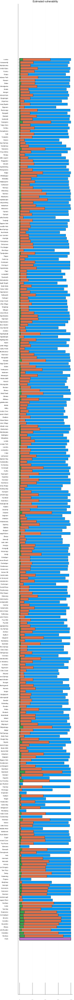

In [32]:
bar(locale,impactloc, legend=:false, orientation='x', rotation=0, xlabel="probability of local transmission", yticks=(0.5:1:length(locale),locale),linetype=:bar,label=nday,size=(600,8000),title="Estimated vulnerability" )


In [33]:
png("remote_p01_TF_covidsafe_nomass.png")

## Michael Small (21/6/20) 

Work in progress, for use as is only.

In [34]:
function getcommunity(popl,i,j=i)
    rr=cumsum([0; popl])
    noder=rr[i]+1:rr[j+1]
    return noder
end
    

getcommunity (generic function with 2 methods)

In [35]:
nr=getcommunity(popl,100,120)

2328545:2329148

In [36]:
i=2
j=4
nr=getcommunity(popl,i,j)
nodecolor=distinguishable_colors(j-i+1)
locales=[]
for k in i:j
    locales=[locales; (k-i+1)*ones(Int,(length(getcommunity(popl,k)),1))]
end
nodefillc = nodecolor[locales];
